In [1]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
#colorsStates = ['orange','firebrick','forestgreen']#['orange','slateblue','forestgreen'] #['#FAA61A','#59C3C3','#9593D9','#99CC66','indigo'] #['darkorange','darkblue','forestgreen','purple']
colorsStates = ['tab:orange','tab:blue', 'tab:green','tab:red']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
# colormap = ['rebeccapurple','teal','darkturquoise','springgreen','gold']
# colormap = ['rebeccapurple','royalblue','limegreen','orange']
colormap = ['tab:purple','tab:pink','tab:cyan','yellowgreen']

In [2]:
labChosen =  ['angelakilab','churchlandlab','wittenlab']
subjectsAll = []
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')



In [3]:
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
bestSigmaInd = 7
bestAlpha = 2
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5
inits = 21

/var/folders/w4/p225s7cd19n0j6tss7pdl21w0000gn/T/ipykernel_49197/2182066282.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)


KeyboardInterrupt: 

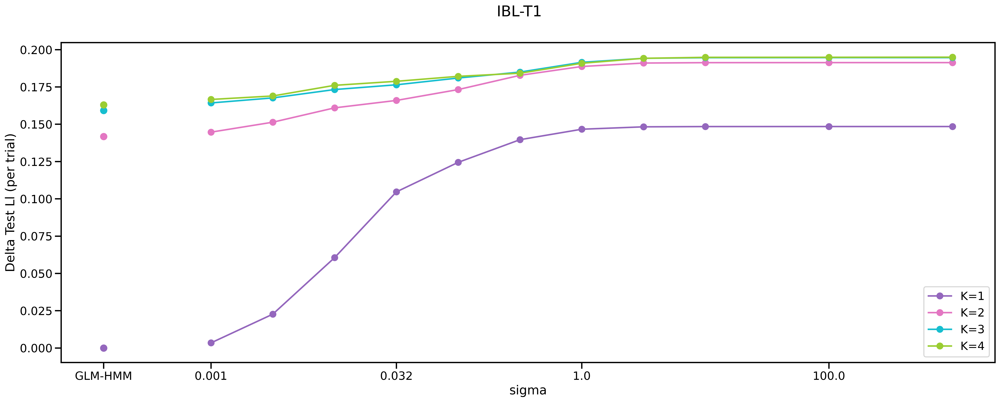

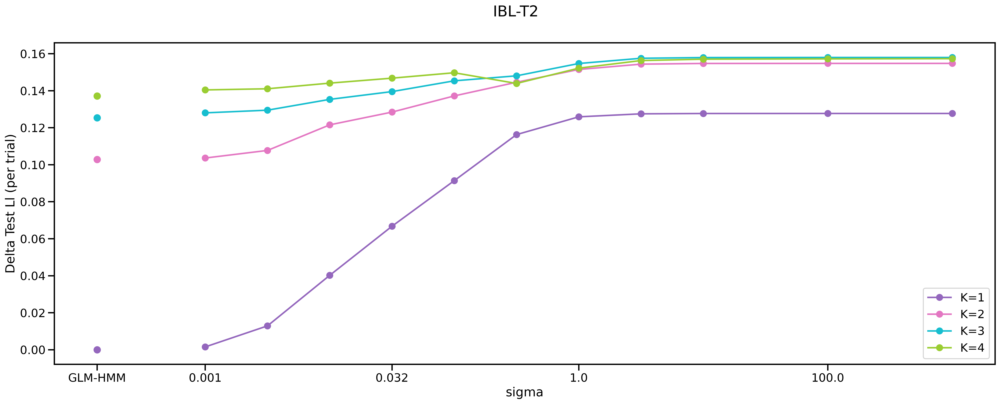

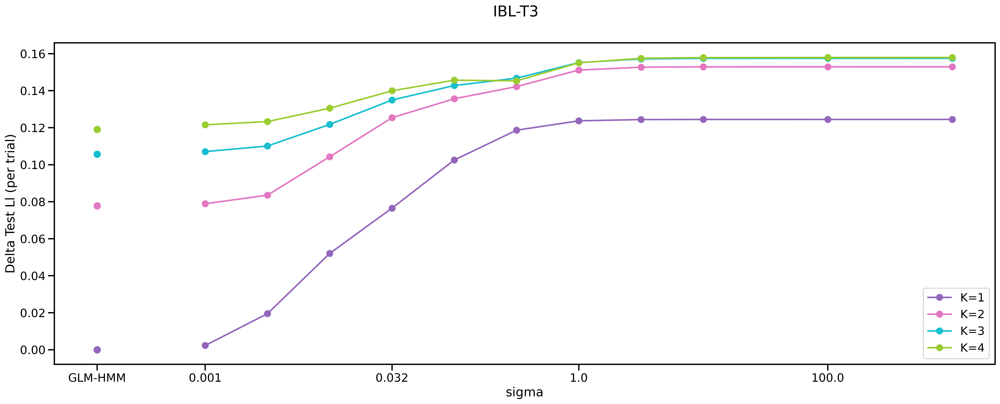

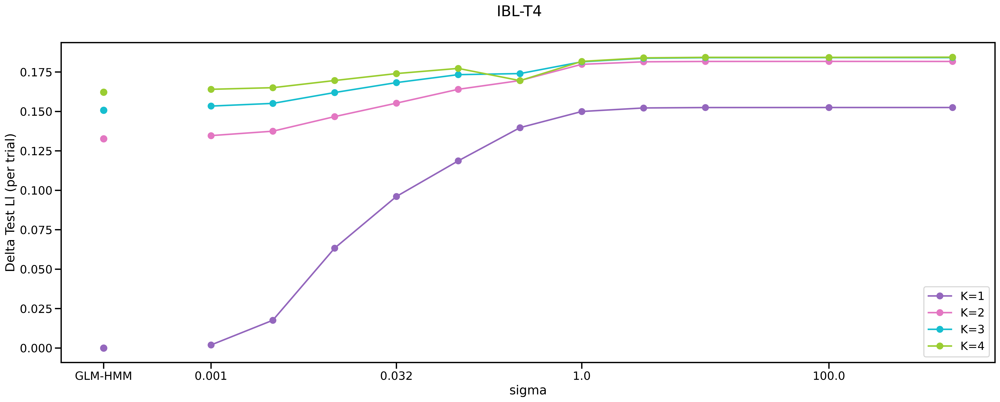

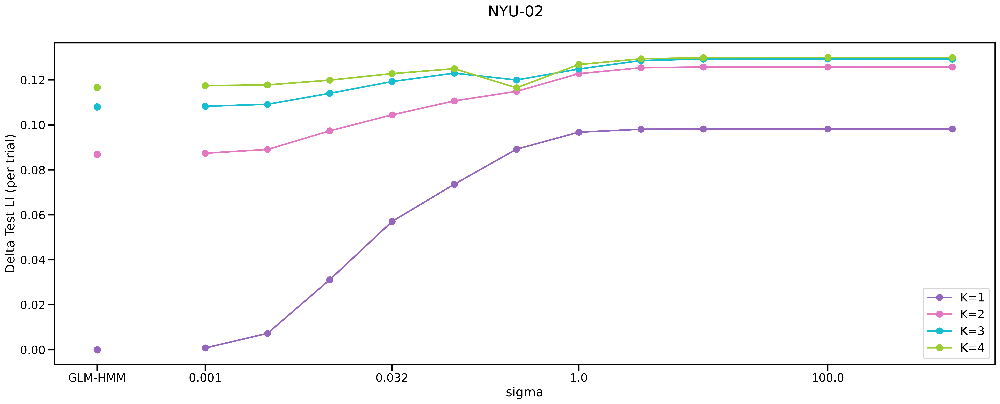

In [4]:
# NEW SAVING OF FILES AND MORE ANIMALS:
testLlAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
testAccuracyAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
bestTestLl = np.zeros((4, len(subjectsAll)))
bestTestAccuracy = np.zeros((4, len(subjectsAll)))

for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    testLl = []
    testAccuracy = []
    avgTestLl = []
    avgTestAccuracy = []
    for K in [1,2,3,4]:
        data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
        # fig.suptitle(f'{subject}')
        # for fold in range(0, splitFolds):
        #     plot_testLl_CV_sigma(data['testLl'][fold], sigmaList=sigmaList, label=f'K={K} fold {fold}', color=colormap[K-1], axes=axes)
        avgTestLl.append(np.mean(data['testLl'],axis=0))
        avgTestAccuracy.append(np.mean(data['testAccuracy'],axis=0))
    avgTestLl = [x - avgTestLl[0][0] for x in avgTestLl] # normalizing to GLM-HMM sigma=0 K=1
    avgTestAccuracy = [x - avgTestAccuracy[0][0] for x in avgTestAccuracy]
    
    for K in [1,2,3,4]:
        testLlAll[K-1][idx] = avgTestLl[K-1]
        testAccuracyAll[K-1][idx] = avgTestAccuracy[K-1]

    bestSigmaInd = 7 # Choosing best sigma index across animals
    for K in [1,2,3,4]:
        bestTestLl[K-1][idx] = avgTestLl[K-1][bestSigmaInd] - avgTestLl[0][bestSigmaInd] # delta
        bestTestAccuracy[K-1][idx] = avgTestAccuracy[K-1][bestSigmaInd] - avgTestAccuracy[0][bestSigmaInd] # delta
    
    # # Plotting delta test ll averaged across folds for per-animal plots
    # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
    # fig.suptitle(f'{subject}')
    # fig.tight_layout()
    # for K in range(1,5):
    #     plot_testLl_CV_sigma(avgTestLl[K-1], sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes)
    # axes.set_ylabel("Delta Test Ll (per trial)")

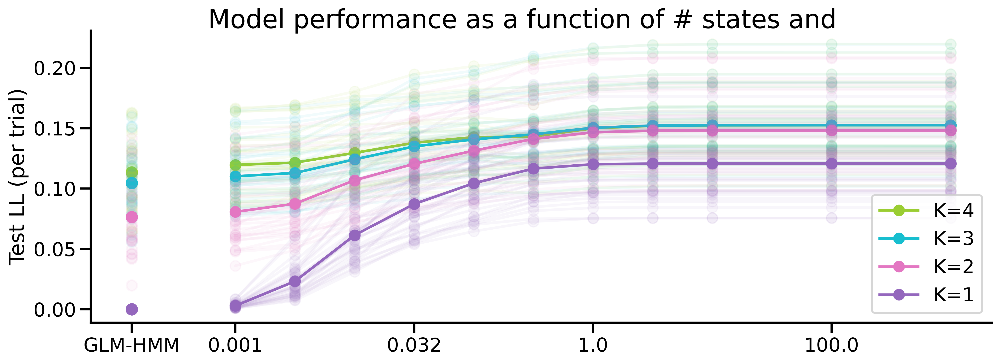

In [5]:
# Plotting one plot with all animals and their mean
fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
fig.tight_layout()
# axes.set_title('averaged across all animals')
for K in range(4,0,-1):
    for idx in range(0, len(subjectsAll)):
        subject = subjectsAll[idx]
        plot_testLl_CV_sigma(testLlAll[K-1][idx], sigmaList=sigmaList, label=None, color=colormap[K-1], axes=axes, alpha=0.06)

    plot_testLl_CV_sigma(np.mean(testLlAll[K-1], axis=0), sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes, alpha=1)
axes.set_ylabel('Test LL (per trial)')
axes.set_xlabel('')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Model performance as a function of # states and ', size=22)
plt.savefig(f'../figures/TestLl_vs_states_sigma_all-animals.png', bbox_inches='tight', dpi=400)

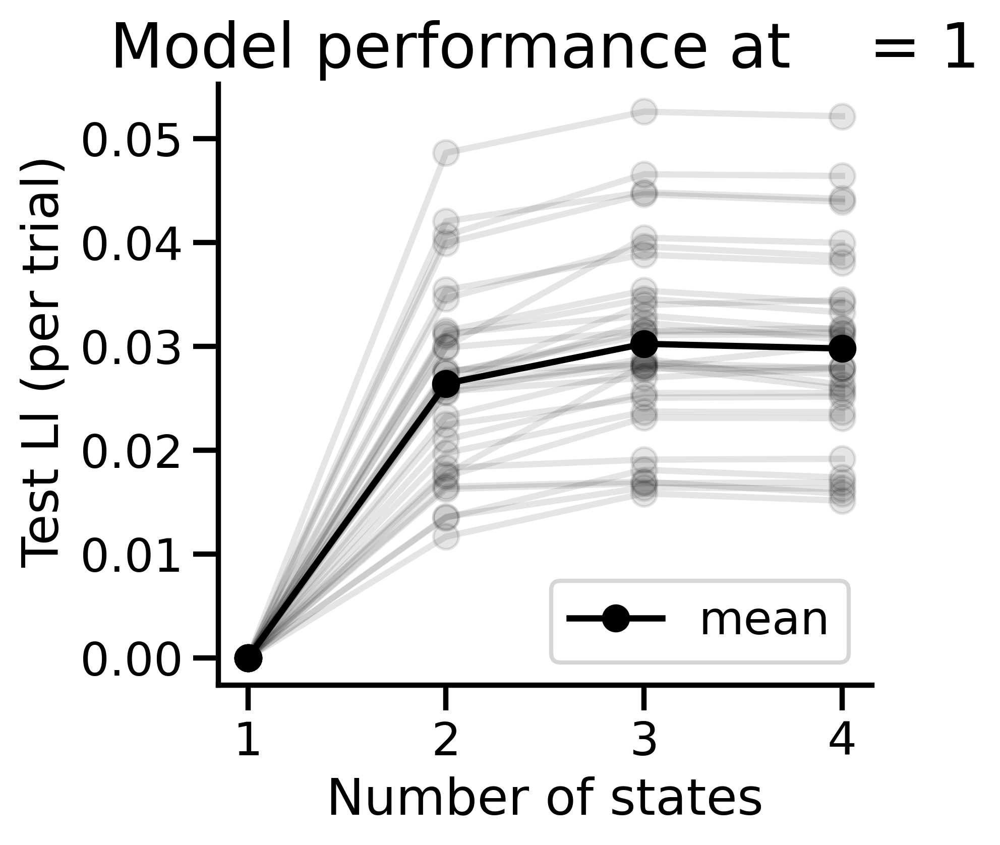

In [6]:
fig, axes = plt.subplots(1,figsize=(4.5,4), dpi=400)
fig.tight_layout()
for idx in range(0, len(subjectsAll)):
    axes.plot([1,2,3,4],bestTestLl[:,idx],'-o', color='black',alpha=0.1)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestLl, axis=1), '-o', color='black',alpha=1, label='mean')
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('Number of states')
axes.set_ylabel('   Test Ll (per trial)')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Model performance at    = 1', size=22)
axes.legend(loc='lower right')
plt.savefig(f'../figures/TestLl_vs_states_sigma=1_all-animals.png', bbox_inches='tight', dpi=400)

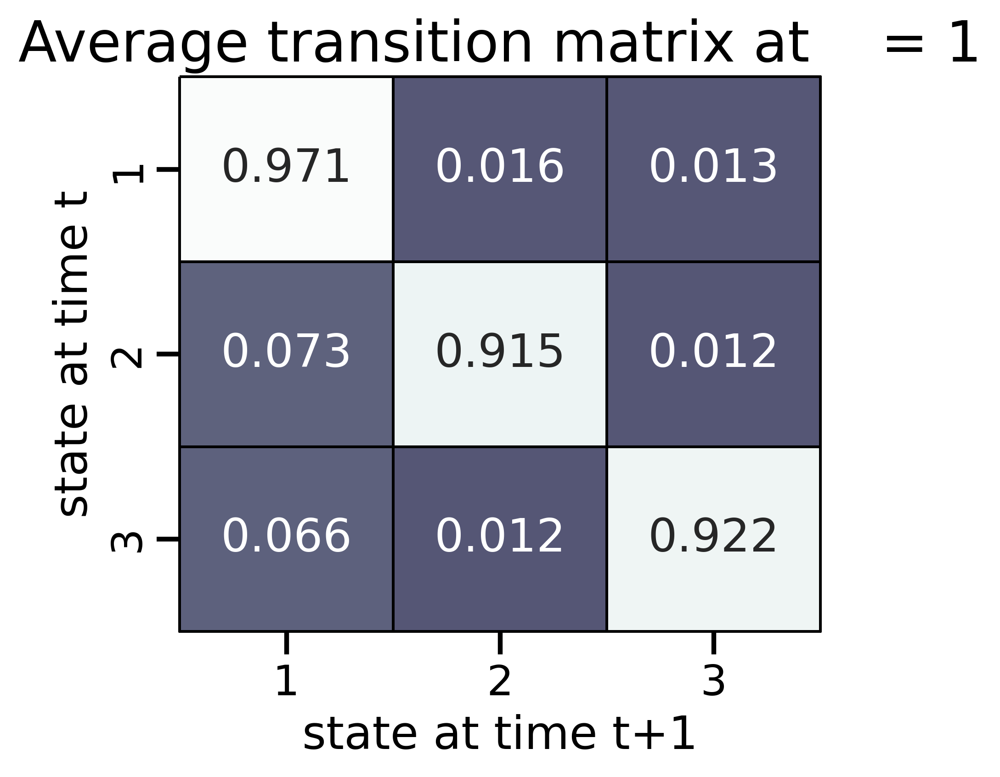

In [7]:
# Reading parameters and plotting them at best sigma for 
bestSigmaInd = 7 # equivalent to sigma=1
K = 3

allP = np.zeros((len(subjectsAll), K, K))   

for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] = np.mean(data['allP'], axis=0)[bestSigmaInd]

plt.figure(figsize=(4.5, 4), dpi=400)
K = np.mean(allP, axis=0).shape[0] # 
s = sns.heatmap(np.round(np.mean(allP, axis=0),3),annot=True, vmin=-0.6, vmax=1,cmap='bone', fmt='g', linewidths=1, linecolor='black',clip_on=False, cbar=False)
s.set(xlabel='state at time t+1', ylabel='state at time t', title=f'', xticklabels=range(1,K+1), yticklabels=range(1,K+1))
plt.title('Average transition matrix at    = 1', size=22)
plt.savefig(f'../figures/AverageP_2-state_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)
      

In [8]:
allW0 = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allW0[idx] = np.mean(data['allW'], axis=0)[0] # standard GLM-HMM

In [9]:
# INIT 0 means initialized from global fit
allW = np.empty((len(subjectsAll)), dtype=object)
allP = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    param = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}_state_alpha={bestAlpha}_multiple-initsP_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] =  param['allP'][0] # starting from best dGLMHMM1 fit
    allW[idx] =  param['allW'][0] # starting from best dGLMHMM1 fit
    

In [10]:
allPhi = np.empty((len(subjectsAll)), dtype=object) # observation probabilities
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    dGLMHMM2 = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allPhi[idx] = dGLMHMM2.observation_probability(x, allW[idx])

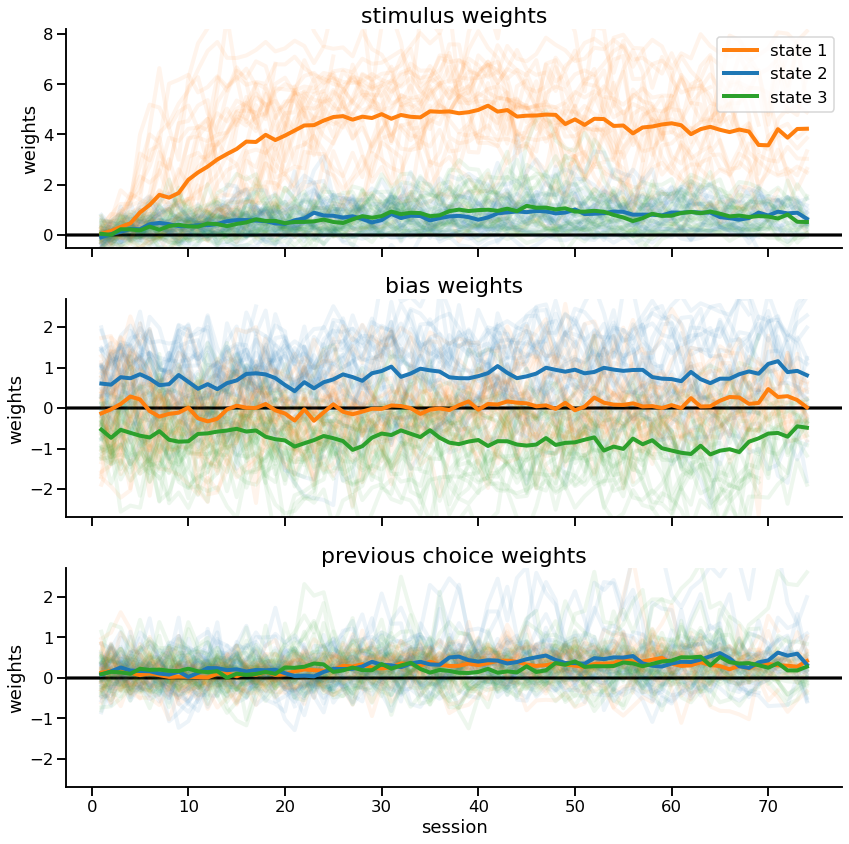

In [11]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
myFeatures = ['stimulus','bias','previous choice','previous correct side']
for K in Kplot:
    arrW = np.ma.empty((maxSess, K, D, 2, len(subjectsAll)))
    arrW.mask = True

    #fig, axes = plt.subplots(D, 1,figsize=(12.5,15), sharex=True)#, dpi=400)
    fig, axes = plt.subplots(D-1, 1,figsize=(12.5,12), sharex=True)
    fig.tight_layout(pad=2)
    yLim=[[-0.5,8.2],[-2.7,2.7],[-2.7,2.7],[-2.7,2.7]]

    avgP = []
    avgW = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgW.append(allW[idx][sessInd[:-1]]) 
        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrW[:stop, :K, :D, :2, idx] = avgW[idx][:stop]
        plotting_weights_per_feature(-(avgW[idx][:stop,:,reorderFeatures[:-1]]), [x for x in range (0, stop)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=0.08, legend=False, sortedStateInd=None)
    # plotting_weights_per_feature(-(allW0[0][:,:,reorderFeatures]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=3, linestyle='--', alpha=1, legend=False, sortedStateInd=None)
    plotting_weights_per_feature(-(arrW.mean(axis=4)[:,:,reorderFeatures[:-1]]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=1, legend=True, sortedStateInd=None)
    

for d in range(0,D-1):
    if (d!=0):
        axes[d].get_legend().remove()
        axes[0].legend(loc = 'upper right')
    axes[d].set_ylim(yLim[d])
    axes[d].set_ylabel(f'weights')
    axes[d].set_title(f'{myFeatures[d]} weights', size=22)
    axes[d].spines[['right', 'top']].set_visible(False)

plt.savefig(f'../figures/weights_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)

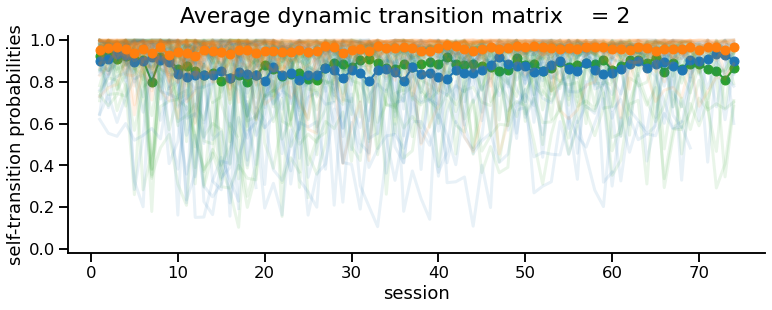

In [12]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
#fig, axes = plt.subplots(1, figsize = (12.5,5))
fig, axes = plt.subplots(1, figsize = (12.5,4))
for K in Kplot:
    arrP = np.ma.empty((maxSess, K, K, len(subjectsAll)))
    arrP.mask = True

    avgP = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrP[:stop, :K, :K, idx] = avgP[idx][:stop]
        sessInd = range(0,stop)
        sess = len(sessInd)-1
        for i in range(0,avgP[idx][:stop].shape[1]):
            axes.plot(range(1,sess+1), avgP[idx][:stop][sessInd[:-1],i,i], linestyle='-', linewidth=3, color=colorsStates[i], label=f'state {i+1}', zorder=avgP[idx][:stop].shape[1]-i, alpha=0.1)
        
        # plotting_self_transition_probabilities(avgP[idx][:stop], range(0,stop), axes, title='', linestyle='-', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    
    plotting_self_transition_probabilities(arrP.mean(axis=3), range(0,maxSess), axes, title='', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    # # plotting transition matrix averaged across folds
    # fig, axes = plt.subplots()
    # plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted

axes.set_ylabel("self-transition probabilities")
axes.set_xlabel('session')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Average dynamic transition matrix    = 2', size=22)
axes.set_ylim(-0.02,1.02)
plt.savefig(f'../figures/Self-transition_probabilties-alpha={bestAlpha}_allAnimals.png', bbox_inches='tight', dpi=400)
          

In [13]:
# Computing posterior latents across animals
allGamma = np.empty((len(subjectsAll)), dtype=object)
K = 3
truepi = np.ones((K))
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    presentAll = np.ones((N))
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allGamma[idx] = dGLM_HMM.get_posterior_latent(allP[idx], truepi, allW[idx], x, y, presentAll, sessInd, sortedStateInd=None)


/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py

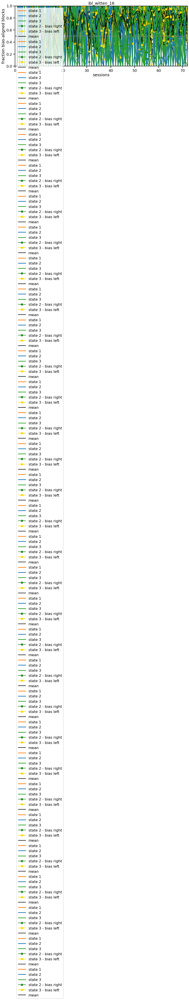

In [16]:
K = 3
allStateCount = np.empty((len(subjectsAll)), dtype=object)
allStateCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallMixtureCorrect = np.empty((len(subjectsAll)), dtype=object)
allStateEasyCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallEasyCorrect = np.empty((len(subjectsAll)), dtype=object)
blocksStateRight = np.empty((len(subjectsAll)), dtype=object)
blocksStateLeft = np.empty((len(subjectsAll)), dtype=object)

fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    # Plotting task occupancy of each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCount[idx] = plot_state_occupancy_sessions(allGamma[idx], sessInd, axes, colors=colorsStates)
    axes.set_ylim(-1,101)

    # plotting task accuracy in each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    _, _, allOverallCorrect[idx], allStateCorrect[idx] = accuracy_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)
    axes.set_ylim(40,100)

    # allOverallMixtureCorrect[idx] = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

    # calculating performance on easy trials for each state
    data = dfAll[dfAll['subject']==subject]
    dateToKeep = np.unique(data['date'])    
    dataTemp = pd.DataFrame(data.loc[data['date'].isin(list(dateToKeep))])
    contrastLeft=np.array(dataTemp['contrastLeft'])
    contrastRight=np.array(dataTemp['contrastRight'])
    easyTrials = (contrastLeft > 0.45).astype(int) | (contrastRight > 0.45).astype(int)

    # computing per state accuracy for easy trials
    N = y.shape[0]
    p_correct_states = np.zeros((N, K))
    p_correct = np.zeros(N)
    p_correct_states_sessions = np.zeros((len(sessInd)-1, K))
    p_correct_sessions = np.zeros((len(sessInd)-1))
    for session in range(0, len(sessInd)-1):
        for t in range(sessInd[session],sessInd[session+1]):
            if (easyTrials[t]==1):
                for k in range(0,K):
                    p_correct_states[t, k] = allPhi[idx][t, k, correctSide[t]]
            p_correct[t] = p_correct_states[t, :] @ allGamma[idx][t]
        p_correct_states_sessions[session] = np.sum(p_correct_states[sessInd[session]:sessInd[session+1]], axis=0) / easyTrials[sessInd[session]:sessInd[session+1]].sum()
        p_correct_sessions[session] = np.sum(p_correct[sessInd[session]:sessInd[session+1]], axis=0) / easyTrials[sessInd[session]:sessInd[session+1]].sum()
    allStateEasyCorrect[idx] = 100 * p_correct_states_sessions
    allOverallEasyCorrect[idx] = 100 * p_correct_sessions

    # Plotting alignment of biased states with biased blocks
    # fig, axes = plt.subplots(1, figsize=(14,5))
    blocksStateRight[idx], blocksStateLeft[idx] = plot_aligned_fraction_blocks_state(allGamma[idx], sessInd, biasedBlockTrials, biasedBlockSession, axes)

    axes.axvline(firstBlockSession+1, color='gray', zorder=0)

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1550: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr)
/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1550: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr)
/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1550: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr)


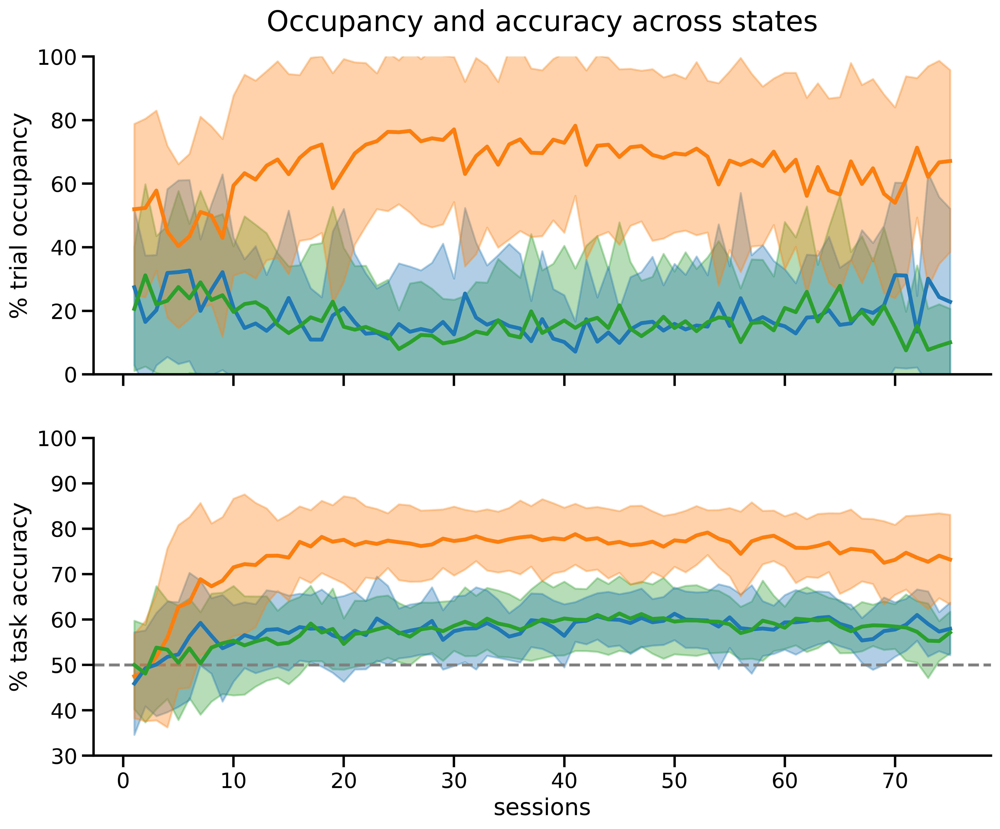

In [18]:
fig, axes = plt.subplots(2, figsize = (12.5,10), sharex=True, dpi=400) 
maxSess = 75
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCount[:stop, :K, idx] = allStateCount[idx][:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[0].plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[0].fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes[0].set_ylabel('% trial occupancy')
axes[0].set_xlabel('')
axes[0].set_ylim(0,100)
axes[0].legend(loc='upper left')

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

arrOverallCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallCorrect.mask = True

axes[1].axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCorrect[:stop, :K, idx] = allStateCorrect[idx][:stop]
    arrOverallCorrect[:stop, idx] = allOverallCorrect[idx][:stop]
    
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)

# axes[1].plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect[:,:], axis=1), color='black', linewidth=3, label=f'state {k+1}', zorder=3)
for k in range(0,K):
    axes[1].plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[1].fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes[1].set_ylabel('% task accuracy')
axes[1].set_xlabel('sessions')
axes[1].set_ylim(30,100)
axes[1].legend(loc='upper left')
axes[0].spines[['right', 'top']].set_visible(False)
axes[1].spines[['right', 'top']].set_visible(False)
axes[0].set_title('Occupancy and accuracy across states', size=22, pad=20)
axes[0].get_legend().remove()
axes[1].get_legend().remove()
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals', bbox_inches='tight', dpi=400)


# Figure 6

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1550: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr)


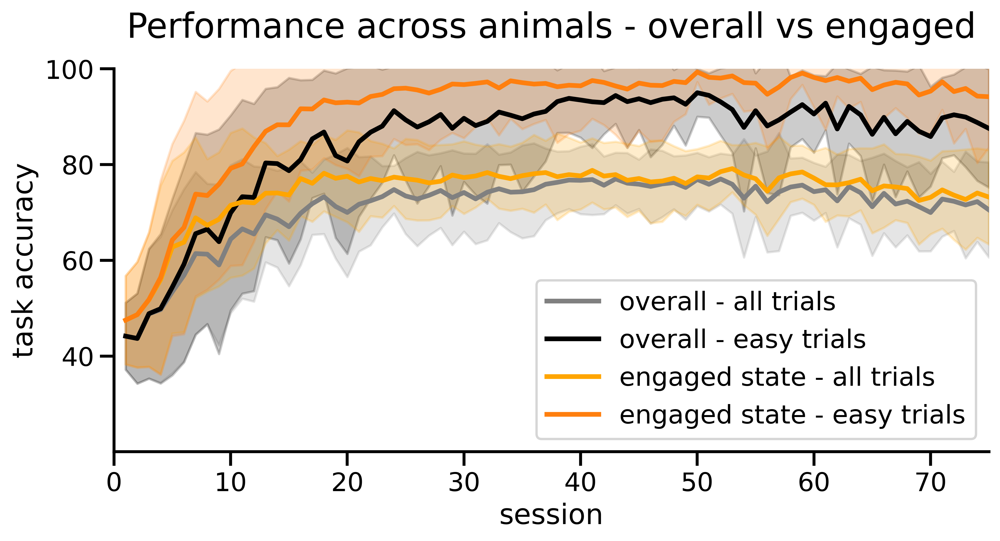

In [19]:
maxSess = 75

arrStateEasyCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateEasyCorrect.mask = True

arrOverallEasyCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallEasyCorrect.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateEasyCorrect[:stop, :K, idx] = allStateEasyCorrect[idx][:stop]
    arrOverallEasyCorrect[:stop, idx] = allOverallEasyCorrect[idx][:stop]
    

# for idx in range(0,len(subjectsAll)):
#     subject = subjectsAll[idx]
#     x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
#     biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, -1)
#     allEasyPerf[idx], allPerf[idx] = IBL_performance(dfAll, subject, plot=False) # empirical accuracy

#     stop = min(len(sessInd)-1, maxSess)
#     arrPerf[:stop, idx] = allPerf[idx][:stop]
#     arrEasyPerf[:stop, idx] = allEasyPerf[idx][:stop]

#     # index 0 for engaged state (state 1)
#     arrEngagedPerf[:stop, idx] = allStateCorrect[idx][:stop,0] / 100 # rescaling from 0 to 1 instead of percentages
#     arrEngagedEasyPerf[:stop, idx] = allStateEasyCorrect[idx][:stop,0] / 100 

fig, axes = plt.subplots(1, figsize = (10,4.5), dpi=400) 
# performance in general
axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1)-np.nanstd(arrOverallCorrect, axis=1), np.nanmean(arrOverallCorrect, axis=1)+np.nanstd(arrOverallCorrect, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1), color="gray", linewidth=3, label='overall - all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallEasyCorrect, axis=1)-np.nanstd(arrOverallEasyCorrect, axis=1), np.nanmean(arrOverallEasyCorrect, axis=1)+np.nanstd(arrOverallEasyCorrect, axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallEasyCorrect, axis=1), color="black", linewidth=3, label='overall - easy trials', zorder=1)


# performance in state 1
axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1)-np.nanstd(arrStateCorrect[:,0,:], axis=1), np.nanmean(arrStateCorrect[:,0,:], axis=1)+np.nanstd(arrStateCorrect[:,0,:], axis=1), alpha=0.2, zorder=0, color="orange")
axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1), color="orange", linewidth=3, label='engaged state - all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1)-np.nanstd(arrStateEasyCorrect[:,0,:], axis=1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1)+np.nanstd(arrStateEasyCorrect[:,0,:], axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1), color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)

axes.set_ylabel('task accuracy')
axes.set_xlabel('session')
axes.set_yticks([40,60,80,100])
axes.set_ylim(20,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Performance across animals - overall vs engaged' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_TotalvsEngaged_allAnimals', bbox_inches='tight', dpi=400)

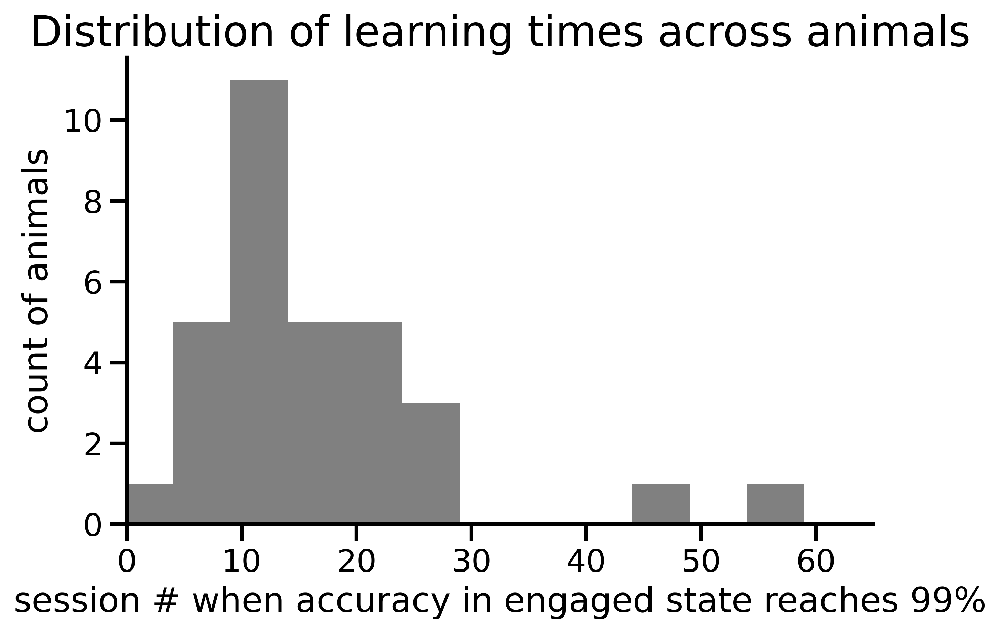

In [20]:
# Learning across animals - Distribution
# Time it takes for accuracy in engaged state to reach threshold 
from astropy.stats import bayesian_blocks
treshold = 99
def learning_time(accuracySession, treshold=0.95): # decide between accuracy on all trials and accuracy on easy trials
    sessions = accuracySession.shape[0]
    time = -1
    for t in range(1,sessions):
        if (np.mean(accuracySession[t-1:t+1]) >= treshold):
            time = t
            break 
    return time

learningTimes = np.zeros((len(subjectsAll)))
for idx in range(0, len(subjectsAll)):
    learningTimes[idx] = learning_time(arrStateEasyCorrect[:,0,idx], treshold=treshold)
fig, axes = plt.subplots(1, figsize = (7, 4.5), dpi=400) 
axes.hist(learningTimes, bins=12, color='gray')
axes.set_xlim(0,65)
axes.spines[['right', 'top']].set_visible(False)
axes.set_xlabel('session # when accuracy in engaged state reaches ' + str(treshold) +'%')
axes.set_ylabel('count of animals')
axes.set_title('Distribution of learning times across animals', size=22)
plt.savefig(f'../figures/LearningTimes_Distribution_allAnimals', bbox_inches='tight', dpi=400)


/var/folders/w4/p225s7cd19n0j6tss7pdl21w0000gn/T/ipykernel_46057/2123820712.py:33: RuntimeWarning: Mean of empty slice
  axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)


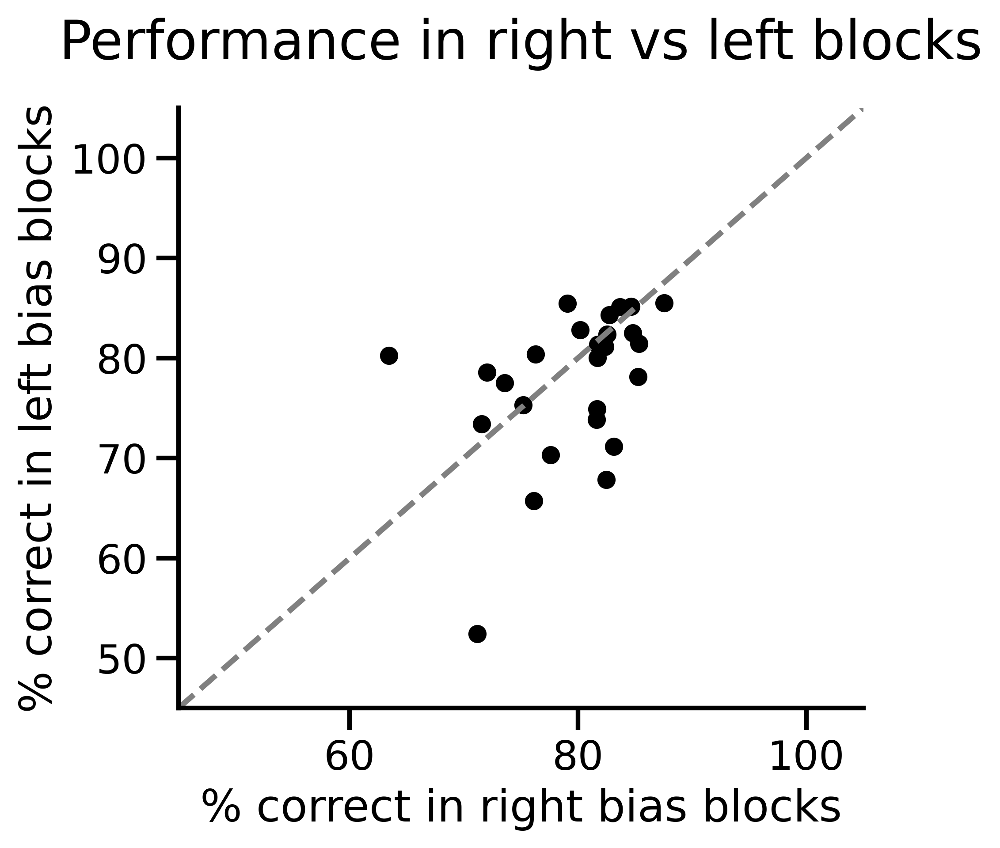

In [21]:
# performance in right vs left blocks
rightBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
leftBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    N = x.shape[0]

    correctChoice = (y == correctSide).astype(int) # 1 if animal made correct choice
    sess = len(sessInd)-1
    rightBiasPerformance[idx] = np.zeros((sess))
    leftBiasPerformance[idx] = np.zeros((sess))
    for s in range(0,sess):
        biasedRight = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==1)
        if biasedRight.sum() > 0:
            rightBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedRight==True)].sum() / biasedRight.sum()
        else: 
            rightBiasPerformance[idx][s] = np.nan
        
        biasedLeft = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==-1)
        if biasedLeft.sum() > 0:
            leftBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedLeft==True)].sum() / biasedLeft.sum()
        else: 
            leftBiasPerformance[idx][s] = np.nan

# plotting right bias performance vs left bias performance across animals avereaged across sessions
fig, axes = fig, axes = plt.subplots(1, figsize = (5,4.5), dpi=400)
sns.set_context("talk")
axes.set_xlabel('% correct in right bias blocks')
axes.set_ylabel('% correct in left bias blocks')
for idx in range(0,len(subjectsAll)):
    axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)
    # ADD DIFFERENT COLOR FOR EACH LAB
axes.set_xlim(45,105)
axes.set_ylim(45,105)
axes.plot([0, 1], [0, 1], transform=axes.transAxes, linestyle='dashed', color='gray')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Performance in right vs left blocks', size=22, pad=20)
plt.savefig(f'../figures/Correct_Right_Vs_Left_ScatterPlot', bbox_inches='tight', dpi=400)

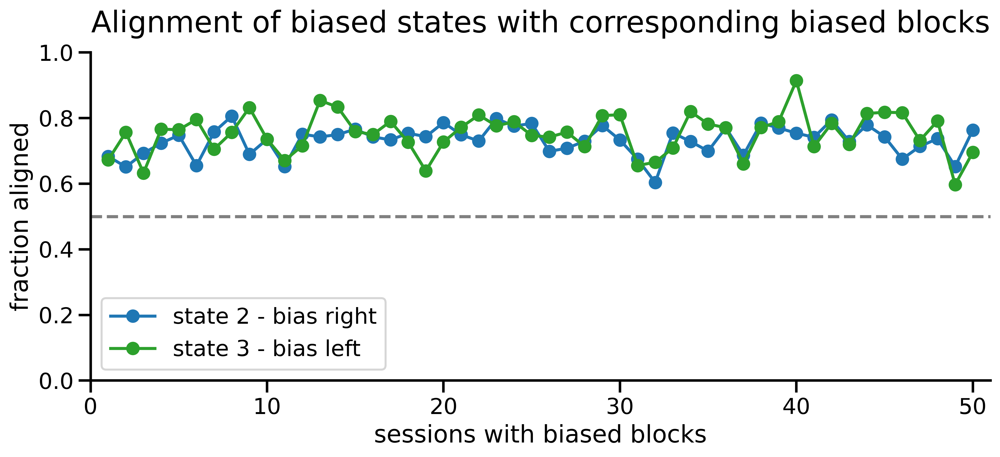

In [22]:
# Average across animals of bias-block alignment with first biased session aligned across animals
maxSess = 50
bestSigmaInd = 7
K = 3

arrAlignRight = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignRight.mask = True

arrAlignLeft = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignLeft.mask = True

fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_title('Alignment of biased states with corresponding biased blocks', size=22, pad=15)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrAlignRight[:stop-firstBlockSession, idx] = blocksStateRight[idx][firstBlockSession:stop]
        arrAlignLeft[:stop-firstBlockSession, idx] = blocksStateLeft[idx][firstBlockSession:stop]
        
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignRight[:,:], axis=1), '-o', color=colorsStates[1], label='state 2 - bias right', alpha=1)
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignLeft[:,:], axis=1), '-o', color=colorsStates[2], label='state 3 - bias left', alpha=1)
# axes.plot(range(1,maxSess+1), (np.nanmean(arrAlignRight[:,:], axis=1)+np.nanmean(arrAlignLeft[:,:], axis=1))/2, '-o', color='black',label='mean')
axes.legend()
axes.set_xlim(0,maxSess+1)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_ylim(0,1)
axes.set_xlabel('sessions with biased blocks')
axes.set_ylabel('fraction aligned')
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Fraction_Aligned_States-and-Blocks_allAnimals', bbox_inches='tight', dpi=400)


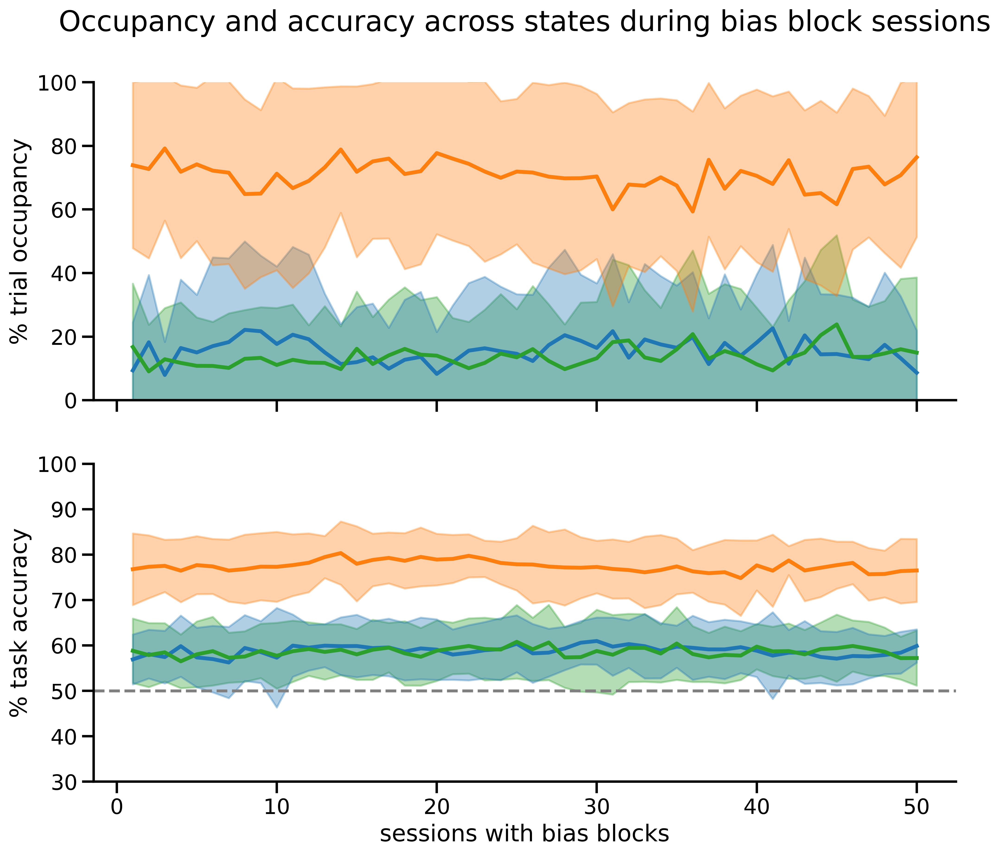

In [23]:
# ALIGNED TO BIASED BLOCKS
fig, axes = plt.subplots(2, figsize = (12,10), sharex=True, dpi=400) 
maxSess = 50
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCount[:stop-firstBlockSession, :K, idx] = allStateCount[idx][firstBlockSession:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[0].plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[0].fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes[0].set_ylabel('% trial occupancy')
axes[0].set_xlabel('')
axes[0].set_ylim(0,100)
axes[0].legend(loc='upper left')

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

axes[1].axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCorrect[:stop-firstBlockSession, :K, idx] = allStateCorrect[idx][firstBlockSession:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
 
for k in range(0,K):
    axes[1].plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[1].fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes[1].set_ylabel('% task accuracy')
axes[1].set_xlabel('sessions with bias blocks')
axes[1].set_ylim(30,100)
axes[1].legend(loc='upper left')
axes[0].spines[['right', 'top']].set_visible(False)
axes[1].spines[['right', 'top']].set_visible(False)
axes[0].set_title('Occupancy and accuracy across states during bias block sessions', size=22, pad=40)
axes[0].get_legend().remove()
axes[1].get_legend().remove()
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals-biasblocks', bbox_inches='tight', dpi=400)


In [24]:
def accuracy_mixture_states_sessions(gamma, phi, y, correctSide, sessInd):
    '''   
    function that probabilistically computes accuracy for each state and overall (no hard assigning)

    P(y_t = correct choice | x_t) = sum over k of p(y_t=correct choice |x_t, z_t=k) * p(z_t=k)

    '''
    K = gamma.shape[1]
    N = y.shape[0]
    p_correct_states = np.zeros((N, K))
    p_correct = np.zeros(N)
    p_correct_sessions = np.zeros((len(sessInd)-1))
    for session in range(0, len(sessInd)-1):
        p_states = np.mean(gamma[sessInd[session]:sessInd[session+1],:], axis=0)
        for t in range(sessInd[session],sessInd[session+1]):
            for k in range(0,K):
                p_correct_states[t, k] = phi[t, k, correctSide[t]]
            p_correct[t] = p_correct_states[t, :] @ p_states
        p_correct_sessions[session] = np.mean(p_correct[sessInd[session]:sessInd[session+1]], axis=0)
    
    return 100*p_correct_sessions


for idx in [0]: #range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    p_correct_sessions = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)
    print(p_correct_sessions)

[50.77823139 54.97594379 74.06190812 77.98051246 69.82159165 85.85540611
 81.98244752 69.33298615 59.26040581 80.61213839 82.60163261 83.99018733
 86.34279092 86.28178422 84.97049233 85.937191   85.74859595 85.51526539
 85.00708224 84.02464608 85.45022397 82.35085867 84.26099088 80.65169629
 83.93291345 86.70476537 87.5346799  87.36354252 79.79721149 85.97069593
 85.83971115 84.83735292 72.90691485 87.61213043 84.73227193 87.23765037
 87.54551841 68.75094175 85.53277837 86.52209922 87.51452707 73.80401953
 88.72115622 87.41120965 85.68430553 86.60701588 87.07591696 86.34561208
 85.92779321 84.42214147 79.81460206 86.6100571  84.71628603 82.94220335
 83.26487692 77.27739846 68.00544927 75.02361226 71.51471604 79.78526617
 72.92218793 49.95431948 82.28235038 75.05259777 70.75376608 76.69406823
 78.28096977 74.62034583 61.55104706 62.68510313 74.51236251 74.7094471
 72.44032361 75.95048683 77.01483238 73.57290945 70.22216569 62.74064257
 84.70846796 62.71003002 71.62110355 72.61886918 78.

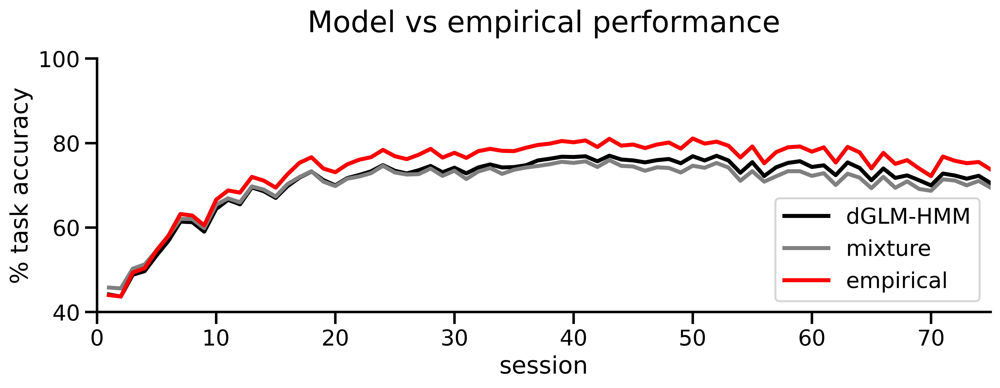

In [35]:
arrEmpiricalCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrEmpiricalCorrect.mask = True
arrOverallMixtureCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallMixtureCorrect.mask = True
maxSess = 75

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, -1)
    # _, allEmpiricalCorrect = IBL_performance(dfAll, subject, plot=False) # empirical accuracy

    empiricalAccuracy = np.zeros((len(sessInd)-1))
    correct = correctSide == y
    for s in range(0,len(sessInd)-1):
        empiricalAccuracy[s] = np.mean(correct[sessInd[s]:sessInd[s+1]]) * 100

    allOverallMixtureCorrect[idx] = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

    stop = min(len(sessInd)-1, maxSess)
    arrEmpiricalCorrect[:stop, idx] = empiricalAccuracy[:stop] 
    arrOverallMixtureCorrect[:stop, idx] = allOverallMixtureCorrect[idx][:stop]

fig, axes = plt.subplots(1, figsize = (12,3.5), dpi=400) 
# dGLM-HMM overall accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1)-np.nanstd(arrOverallCorrect, axis=1), np.nanmean(arrOverallCorrect, axis=1)+np.nanstd(arrOverallCorrect, axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1), color="black", linewidth=3, label='dGLM-HMM', zorder=1)

# Mixture overall accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallMixtureCorrect, axis=1)-np.nanstd(arrOverallMixtureCorrect, axis=1), np.nanmean(arrOverallMixtureCorrect, axis=1)+np.nanstd(arrOverallMixtureCorrect, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallMixtureCorrect, axis=1), color="gray", linewidth=3, label='mixture', zorder=1)

# empirical accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrect, axis=1)-np.nanstd(arrEmpiricalCorrect, axis=1), np.nanmean(arrEmpiricalCorrect, axis=1)+np.nanstd(arrEmpiricalCorrect, axis=1), alpha=0.2, zorder=0, color="red")
axes.plot(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrect, axis=1), color="red", linewidth=3, label='empirical', zorder=1)


axes.set_ylabel('% task accuracy')
axes.set_xlabel('session')
# axes.set_yticks([40,60,80])
axes.set_ylim(40,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Model vs empirical performance' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_Model-Empirical-Mixture_allAnimals', bbox_inches='tight', dpi=400)

   

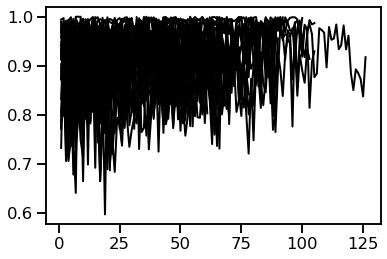

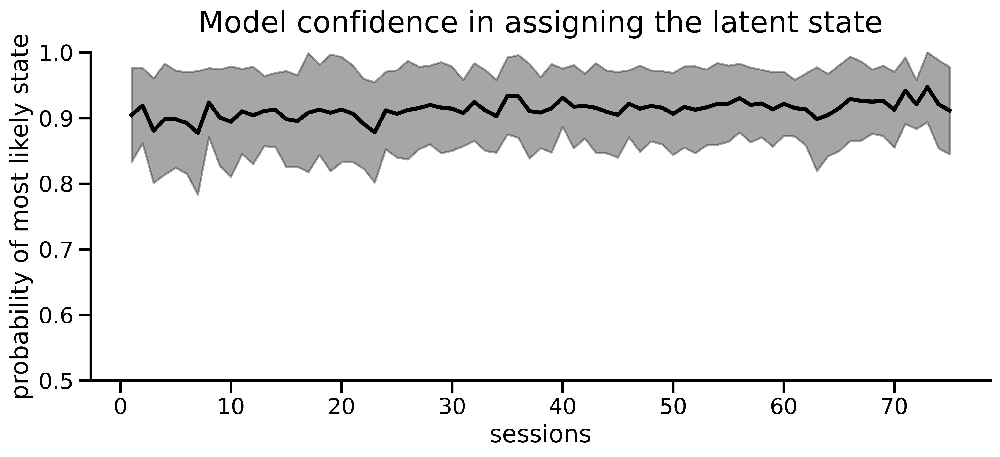

In [ ]:
# Probability of most likely state - average across animals
maxSess = 75
bestSigmaInd = 7
K = 3

arrProbStateMax = np.ma.empty((maxSess,len(subjectsAll)))
arrProbStateMax.mask = True

fig, axes = plt.subplots(1) 
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    probMaxSession = distribution_most_likely_state(allGamma[idx], sessInd, axes)
    
    stop = min(len(sessInd)-1, maxSess)
    arrProbStateMax[:stop, idx] = probMaxSession[:stop]

fig, axes = plt.subplots(1, figsize = (12,4.5), sharex=True, dpi=400) 
axes.plot(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1), color='black', linewidth=3)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1)-np.nanstd(arrProbStateMax, axis=1), np.nanmean(arrProbStateMax, axis=1)+np.nanstd(arrProbStateMax, axis=1), alpha=0.35, color='black')
axes.set_ylabel('probability of most likely state')
axes.set_title('Model confidence in assigning the latent state', size=22, pad=15)
axes.set_xlabel('sessions')
axes.set_ylim(0.5,1)
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Probability_most_likely_state_allAnimals', bbox_inches='tight', dpi=400)


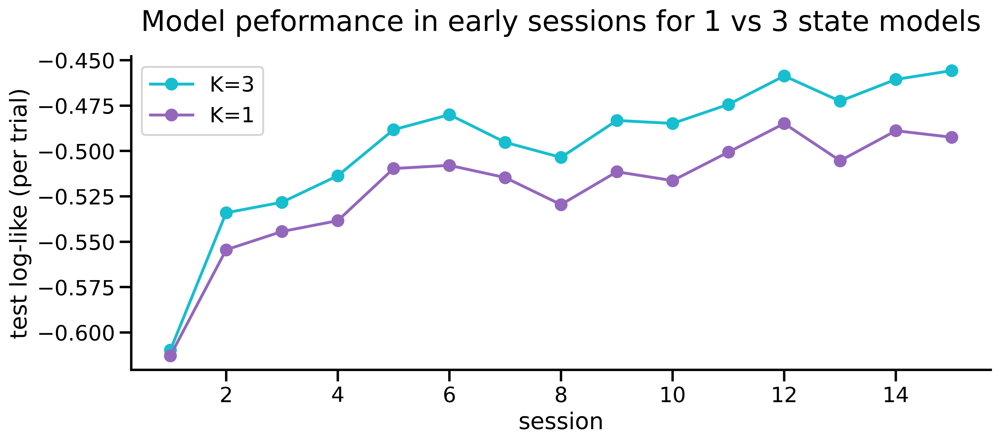

In [ ]:
# setting hyperparameters
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5

bestSigmaInd = 7 # equivalent to sigma=1
bestAlphaInd = 2 # equivalent to alpha=2

allW = np.empty((len(subjectsAll), 4), dtype=object)
allP = np.empty((len(subjectsAll), 4), dtype=object)
sessInterest = 15
testLl = np.zeros((len(subjectsAll), 2, sessInterest, splitFolds))
for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    N = x.shape[0]
    presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)
    
    data1 = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_1-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    
    for fold in range(0, splitFolds):
        data3 = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_3-state_fold-{fold}_multiple-alphas_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        
        W_3state = data3['W'][bestAlphaInd]
        P_3state = data3['P'][bestAlphaInd]
        pi3 = np.ones((3))/3
        W_1state = data1['allW'][fold, bestSigmaInd]
        P_1state = np.ones((N,1,1))
        pi1 = np.ones((1))

        dGLM_HMM_3state = dglm_hmm2.dGLM_HMM2(N,3,D,2)
        testLlSessions = dGLM_HMM_3state.evaluate_per_session(x, y, sessInd, presentTest[fold], P_3state, pi3, W_3state)
        testLl[idx,1,:,fold] = testLlSessions[0:sessInterest]

        dGLM_HMM_1state = dglm_hmm2.dGLM_HMM2(N,1,D,2)
        testLlSessions = dGLM_HMM_1state.evaluate_per_session(x, y, sessInd, presentTest[fold], P_1state, pi1, W_1state)
        testLl[idx,0,:,fold] = testLlSessions[0:sessInterest]

fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
avgTestLl = np.mean(testLl, axis=3)
avgTestLl = np.mean(avgTestLl, axis=0)
axes.plot(range(1,sessInterest+1), avgTestLl[1], '-o', color = colormap[2], label='K=3')
axes.plot(range(1,sessInterest+1), avgTestLl[0], '-o', color = colormap[0], label='K=1')
axes.set_xlabel('session')
axes.set_ylabel('test log-like (per trial)')
axes.legend()
axes.set_title('Model peformance in early sessions for 1 vs 3 state models', size=22, pad=20)
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Test_Log-Like_1vs3states_early_sessions', bbox_inches='tight', dpi=400)
